# Object Localization
- In order to build up the object detection, we first learn about object localization.
- Image classification task is an algorithm where an algorithm looks at the picture and might be resposible for saying this is a car, etc. So this is classification.
- The problem we learn to build in our network to address is classification with localization which means not only do we have to label as a car but the algorithms also is responsible for putting a bounding box or drawing a rectange around the position of car in the image.
- The term localization refers to figuring out where in the picture is the car we've detective.
- We then learn about the detection problem where there might be multiple objects in the picture and we have to detect them all and localize them all.
- In the detection problem there can be multiple objects, maybe even multiple objects of different categories within a single image.
- So the ideas we've learned about for image classification will be useful for classification with localization. That the ideas we learn for localization will then turn out to be useful for detection.
- 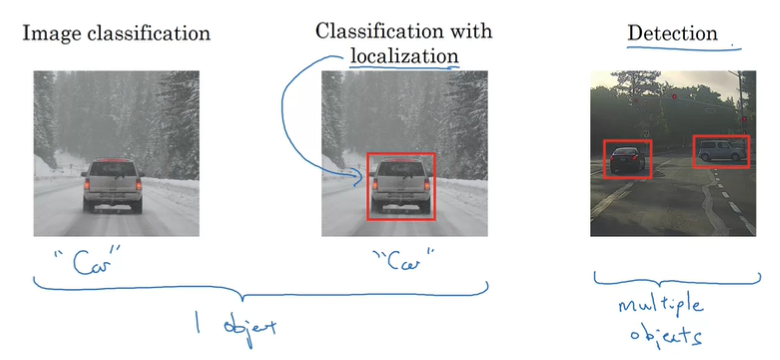

## Classification with localization
- Standard Classification pipeline :
    - We might input a picture into a ConvNet with multiple layers. This results in a vector features that is fed to maybe a softmax unit that outputs the predicted class.
    - So if we are building a self driving car, our object categories can be pedestrain, car, motorcycle or background.
- If we want to localize the car in the image. To do that, we can change our neural network to have a few more output units that output a bounding box. 
- We can have the neural network output 4 more numbers, bx, by, bh and bw and these 4 numbers parameterized the bounding box of the detected object.
- So if our training set contains not just the object class label, which a neural network is trying to predict up here, but it also contains 4 additional numbers. Giving the bounding box then we can use supervised learning algorithm to make our algorithm outputs not just a class label but also the 4 parameters to tell us where is the bounding box of the object we detected.
- 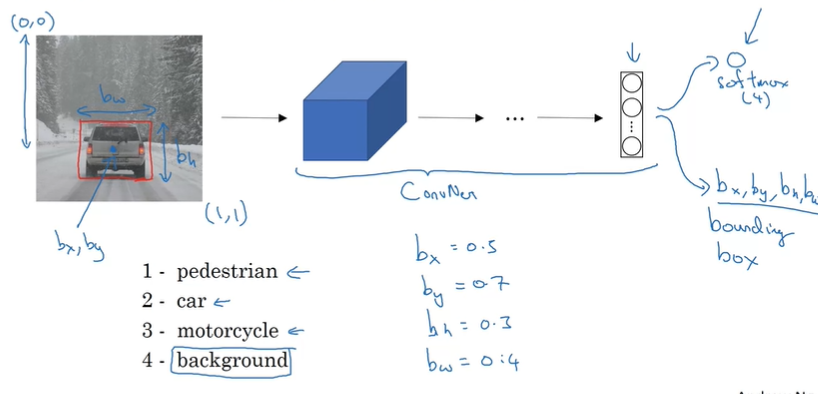

## Defining the target label y
- So the neural network outputs 4 numbers as well as a class label.
- Lets define the target label y as :
    - pc : Is there an object -  0 or 1 for pedestrain, car, motorcycle or background 
    - bx, by, bh and bw : The bounding box for the object we detected.
    - If pc = 1, c1, c2, c3: Tells us the class Pedestrain (0), car (1), motorcycle (3).
- The ground truth label was y and the network outputs y_hat. The loss be : Notice that y here has 8 components, we could use any error function
- 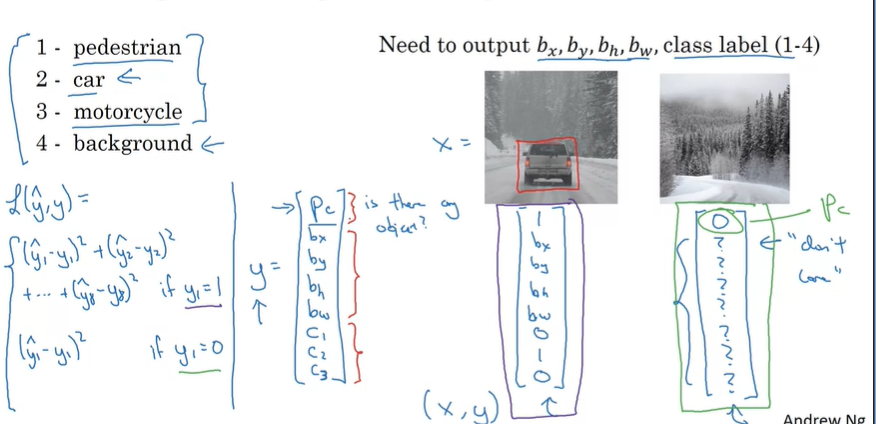

# Landmark Detection
- We can have a neural network just output X and Y coordinates of important points and image, called landmarks, that we want the neural network to recognize.
- Let's say we're building a face recognition application and we want the algorithm to tell us where is the corner of someones's eye so that point has an X and Y coordinate.
    - We can just have a neural network have its final layer and have it just output 2 more numbers which are called lx and ly to just tell us the coordinates of that corner of the person's eye. 
    - What if we need more points : Maybe some key points along the mouth, so we can extract the mouth shape and tell if the person is smiling or frowning, maybe extract a few key points along the edges of the nose.
    - We could define some number, for the sake of argument. Let's say 64 points or 64 landmarks on the face. The help us define the edge of the face, defines the jaw line.
    - By selecting a number of landmarks and generating a label training sets that contains all of these landmarks, we can then have the neural network to tell us where are all the key positions or the key landmarks on a face.
- We have an image, a person's face as input, have it go through a convnet and have a convnet, then have some set of features, have it output 
    - 0 or 1, like zero face changes or not
    - l1x, l1y....l64x, l64y
- 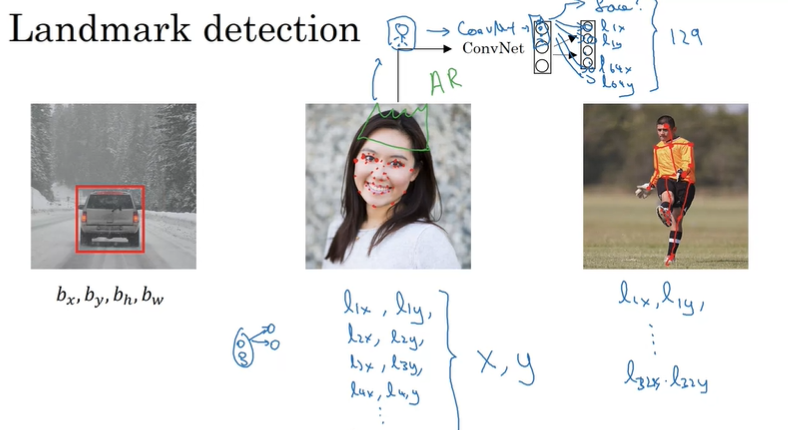
- To be clear, the identity of landmark one must be consistent across different images like maybe landmark one is always this corner of the eye, landmark two is always this corner of the eye, landmark three, landmark four, and so on. So, the labels have to be consistent across different images.

# Object Detection
- To use a ConvNet to perform object detection using something called the Sliding Windows Detection Algorithm.
- Let's build a car detection algorithm :
    - We can 1st create a label training set x and y with closely cropped examples of cars. 
    - Given the label training set, we can then train a ConvNer that inputs an image, like one cropped images. Then the job of the ConvNet is to ouput y, zero or one, is there a car or not. 
    - 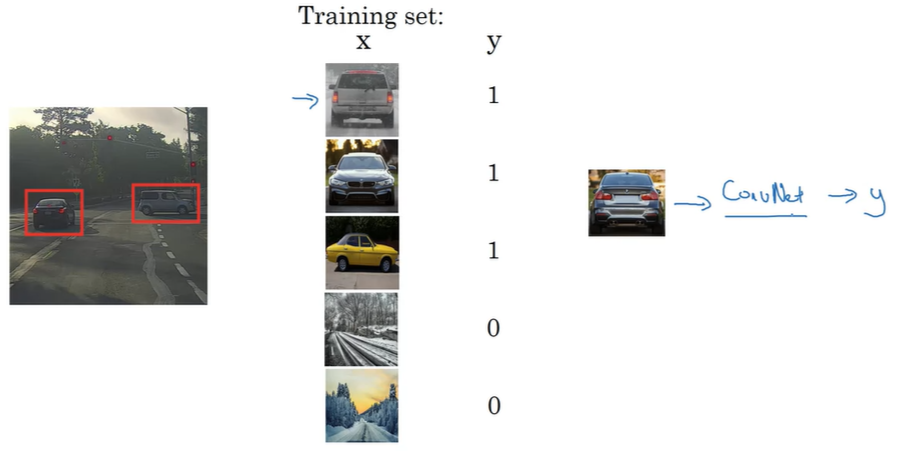
    - Once we've trained up the ConvNet we can then use it in Sliding Window Detection.
    - If we have a test image, what we do is we start by picking a certain window size. Then we would input the that window size image to the ConvNet a small rectangular region. So take that small rectangular input into the ConvNet and have a ConvNet make a prediction. 
    - In the Sliding Window Detection Algorithm, what we do is we pass the next image by shifting the window and feed that to the ConvNet. 
   - We're feeding just the region of the image in the window to the ConvNet. 
   - We keep going until we've slide the window across every position in the image.
   - We then repeat it, but now use a larger window. So resize the region into whatever input size the ConvNet is expecting, and feed that to the ConvNet and have it output zero or one. Then slide the window over again using some stride and so on and we run that through our entire image until we get to the end. 
   - Then we migh do even larger windows and so on.
   - If there's a car somewhere in the image that there will be a window where the Convnet will have outputs one for that input region. So then we detect that there is a car there. 
   - 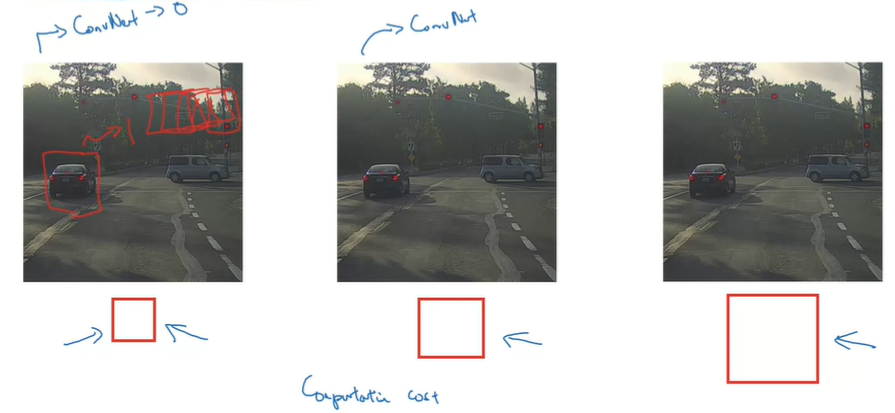
- The idea is basically go through every region of the size and pass lots of little cropped images into the ConvNet and have it classified zero or one for each position as some stride.
- The algorithm take these windows and slide them across the entire image and classify every window region with some stride as containing a car or not.
- The huge disadvatange is the computational cost.

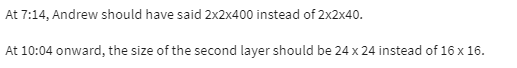

# Convolutional Implementation of Sliding Windows
## Turning FC layer into Convolutiona layers
- To build up towards the convolutional implementation of sliding windows let's see how we can trun fully connected layers in neural network into convolutional layers.
- Let's say we have an input image 14x14x3 and ouputs y by passing over several layers :
    - So here instead of Y as one number change Y as 4 numbers, correponding to the class probabilities of the 4 classes that softmax units is classified amongst.
    - Here for the fully connected layer FC, implement the fully connected layer as a 5x5 filter and let's use 400 5x5 filters. 
- 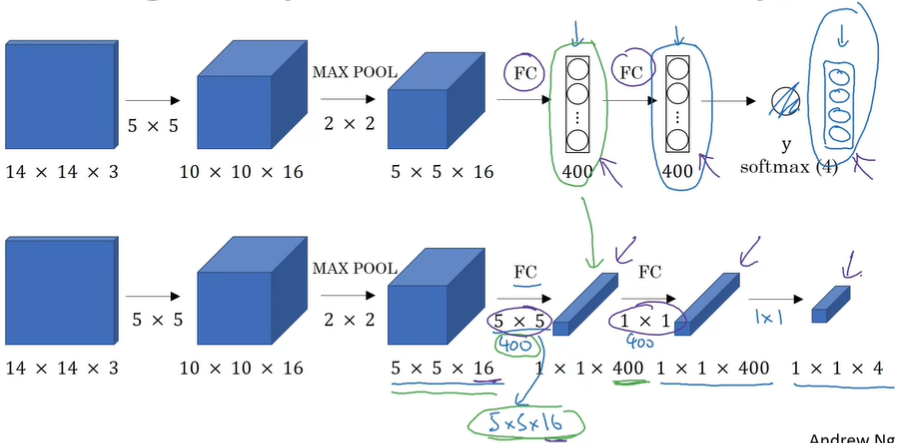

## Convolution implementation of sliding windows
- Let's say that our convnet inputs 14x14x3 image and our test image is 16x16x3
- 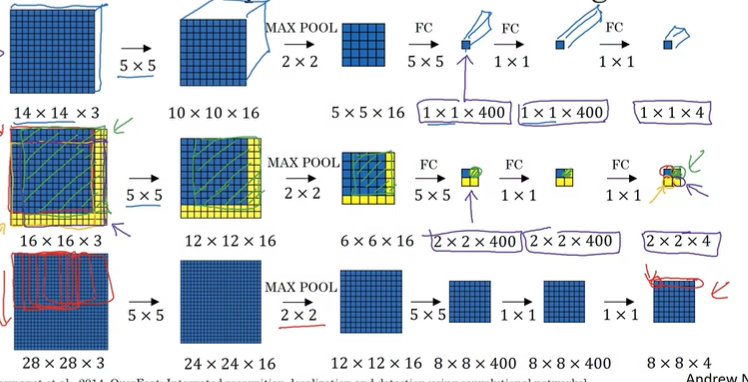
- Let's say 14x4 and run that through our Convet and do that for the next region over then that for the next 14x14 region, then next one and so on, until hopefully that one recognized the car. 
- Instead of doing it sequentially, with the convolutional implementation, we can implement the entire image, all maybe 28x28 and convolutionally make all the predictions at the same time bye one forward pass through the big convnet and hopefully have it recognize the position of th car.  
- 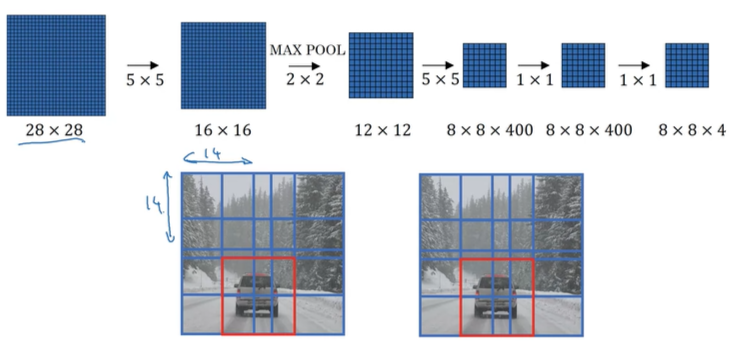

# Bounding Box Predictions
## YOLO
- A good way to get the ouput more accurate bounding boxes is with the YOLO algorithm. 
- YOLO stands for Only Look Once. 
- Let's say we have an input image 100x100 and we're going to use a 3x3 grid.
    - The basic idea is we're going to ake the image classification and localization algorithm and apply it to each of the 9 grdids. 
    - For each of the 9 grids, we specify a label Y, where the label Y is the 8 dimensiona vector [PC, Bx, By, Bh, Bw, c1, c2, c3]. 
    - Because we have 3x3 grid cells, we have 9 grid cells. For each of the 3x3 grid cells, we have a 8 dimensional Y vector. So the target output volume is 3x3x8. 
    - The advatange of the algorithm is that the neural network outputs precise bounding boxes as follows. 
    - At test time, what we do is we feed an input image X and run forward prop until we get the output Y. Then for each of the 9 ouputs of each of the 3x3 positions in which of the output.
    - The problem is if the same grid has multiple objects. 
    - This is one single convolutional implementation, where we use one convnet with a lot of shared computation b/w all the computations needed for all of our 3x3 cells.
    - 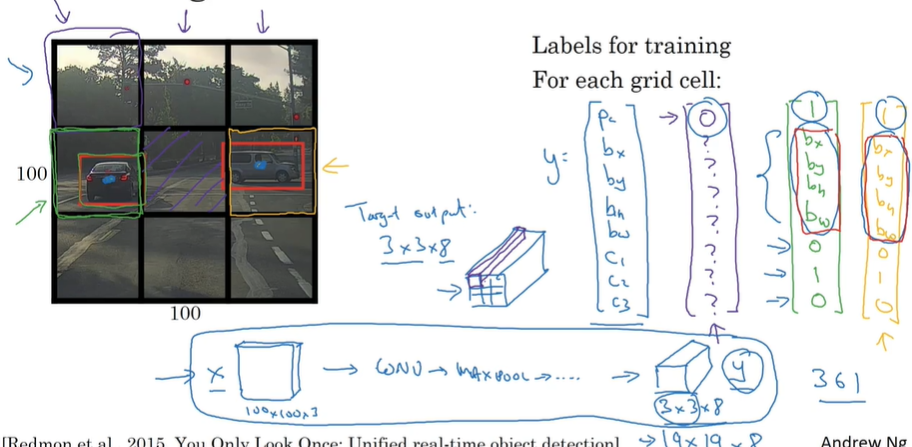
   
## Specify the bounding boxes
- How do we encode these bounding boxes bx, by, bh, bw?
- In the YOLO algorithm, relative to one grid, when we take the convention that the upper left point is (0, 0) and the lower right point is (1, 1).
- 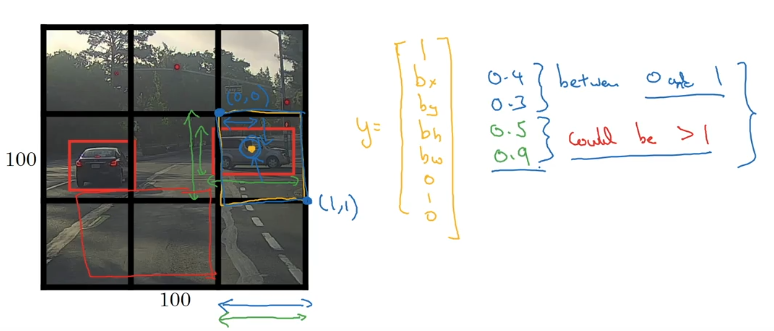

# Intersection Over Union
- Used both for evaluating our object detection algorithm, using it to add another component to our object detection algorith, to make it work even better.
- Intersection over the union function computes the intersection over the ground-truth bounding box and the predicted bounding box.
- It computes the size of the intersection. It divides the union area with the predicted bounding box area.
- As long as the IOU is greater than or equal to 0.5, then the answer will be descent. If the predicted and the ground-truth bounding boxes overalapped perfectl, the IOU would be 1, because the intersection would equal to the union.
- The higher the IOUs, the more accurate the bounding the box.
- 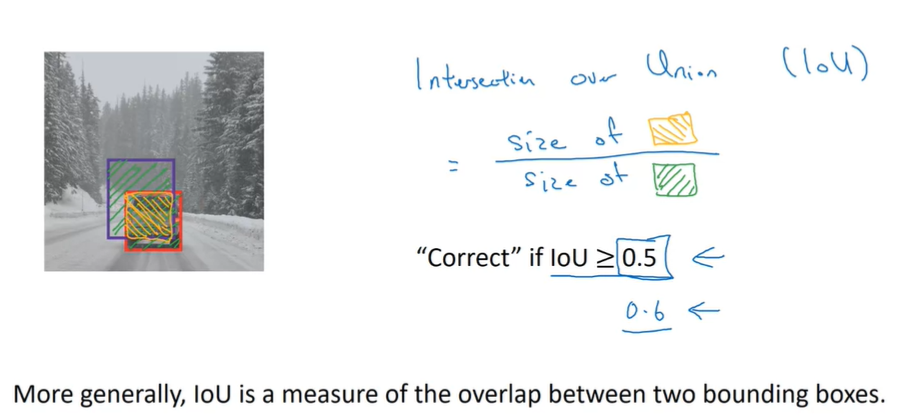

# Non-Max Suppression
- One of the problems of object detection is that our algorithm may find multiple detections of the same objects. Rather than detecting an object just once, it might detect it multiple times.
- Non-max suppression is a way for us to make sure that our algorithm detects each object only once.
- 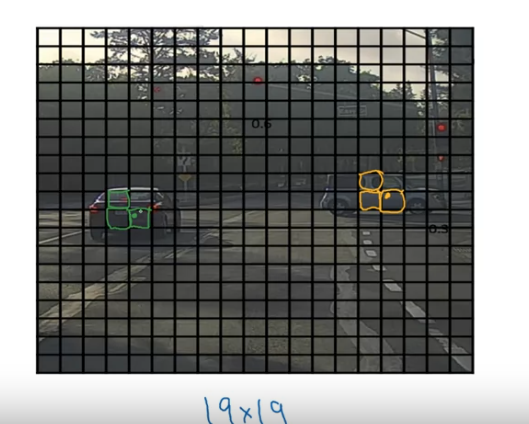
- Let's step through an example of how non-max suppression will work :
    - We're running the image classification and localization algorithm on every grid cell, on 361 grid cells.
    - When we run our algorith, we might end up with multiple detections of each object.
    - So, the non-max suppression cleans up the detections. So they end up with just one detection per car, rather than multiple detections per car. 
    - So, concretely, what it does, is it first looks at the probabilites associated with each of these detections. 
    - Let's just say is Pc with the probability of a detection. It take the largest one, which in this case is 0.9. So that's our most confident detection.
    - Having done that the non-max suppression part then looks at all the remaning rectanges and all the ones with a high overkap, with a high IOU, with this one that we've just output will get suppressed.
    - Non-max means that we're going to output our maximal probabilites classifications but supress the close-by ones that are non-maximal.
    - 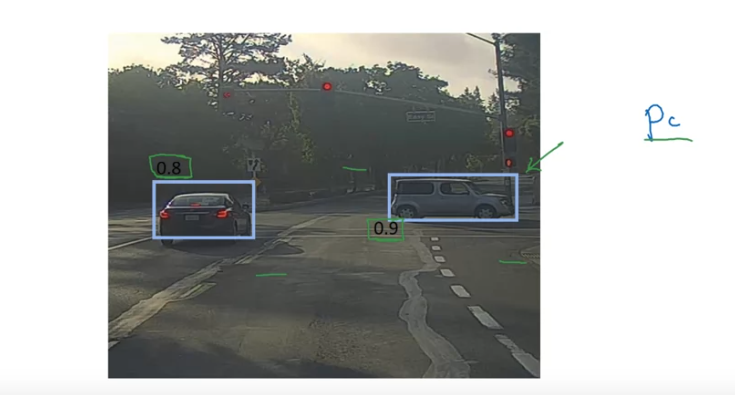
    - 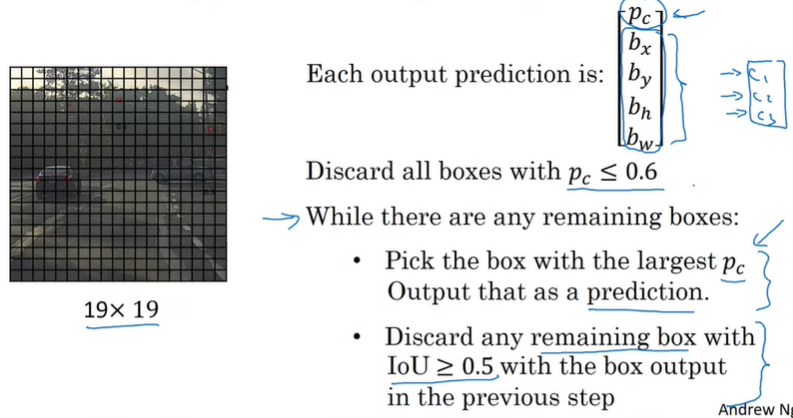

# Anchor Boxes
- One of the problems with object detection is that each of the grid cell can detect only one object.
- What if a grid cell wants to detect multiple objects?
- In this example, the midpoint of the pedestrain and the midpoint of the car are in almost the same place and both of them fall into the same grid cell.
- With the idea of anchor boxes, what we are going to do is pre-define 2 different shapes called, anchor boxes or anchor box shapes. We can use the one box output to encode it as a pedestrain and another box output to encode it as a car.
- 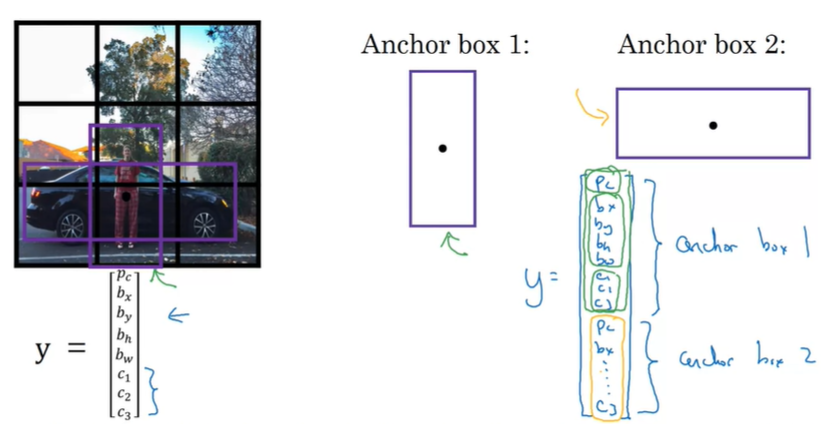

## Anchor Box Algorithm
- To summarize, previosuly before we are using anchor boces, we did :
    - For each object in training image is assigned to grid cell that contains that object's midpoint. So for 3x3 grid we get 3x3x8 output Y becuase each grid has a vector of 8 size.
- With the 2 anchor boxes :
    - Each object in training image is assigned to grid cell that contains object's midpoint and anchor box for the grid cell with highest IoU.
    - Maybe 2 anchor boxes has a different shape, then we see which of the 2 anchor boxes has a higher IoU, will be drawn through bounding box. Whichever it is, that object then gets assigned not just to a grid cell but to a pair. It gets assigned to grid cell comma anchor box pair. That's how that object gets encoded in the target label.
    - So now, the output Y is going to be 3x3x16. If we have nore objects than the dimenison of Y would be even higher
- 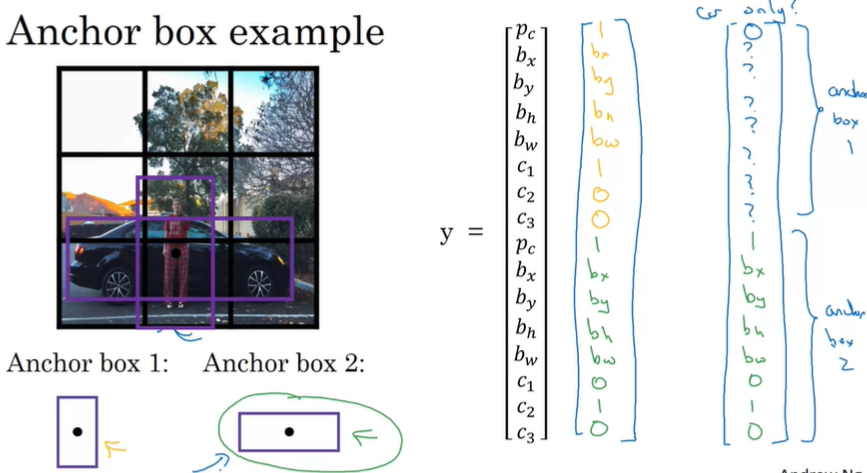

# YOLO Algorithm
## Training
- Suppose we're trying to train an algorithm to detect 2 objects : pedestrains, cars, and motorcycles.
    - If we are using 2 anchor boxes, then the outputs y will be 3x3x16 or 3x3x2x8 because we are using 3x3 grid cell, 2 this is the number of anchors, 8 becuase that's the dimension.
    - The dimension is equal to the number of classes
    - To construct the training set, we go through each of these 9 grid cells and form the appropriate target vector y. 
    - So assuming that our training set has a bounding box for the car. If we use 2 anchor box. The anchor box with higher IoU will be considered.
- That's training and we train ConvNet taht inpts an image, 100x100x3 and our ConvNet would then finally output 3x3x16 or 3x3x2x8.
- 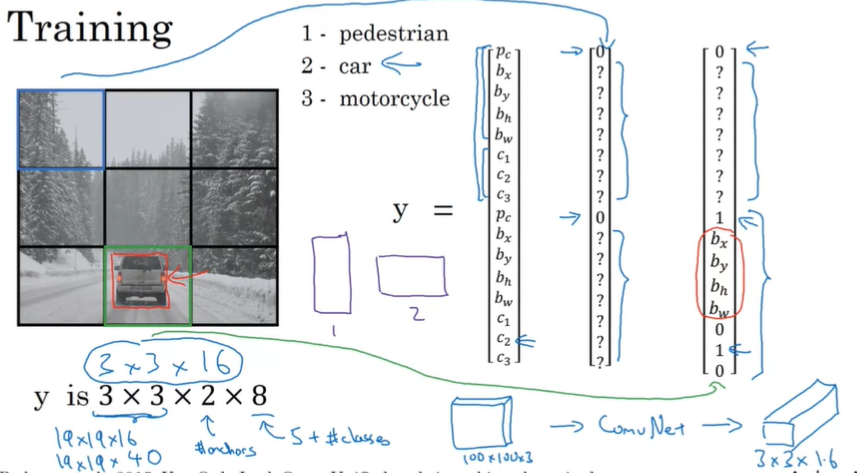

## Making Predictions
- Given an image, our neural network will output 3x3x2x8 volume, where for each of the 9 grid cells we get a vector of 2x8 or 16 values.
- 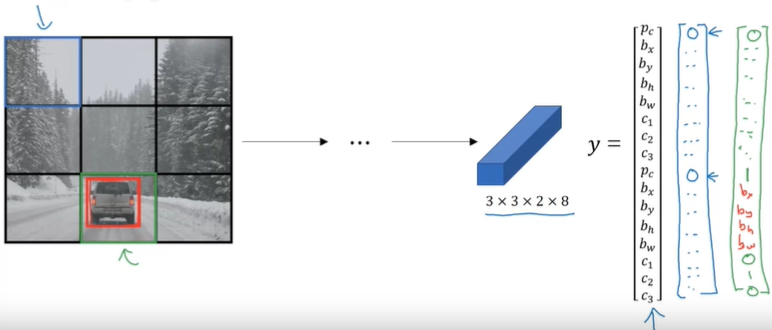
- Finally we will run this through non-max suppression.

## Outputting the non-max supressed outputs
- If we're using 2 anchor boxes, then for each of the non-grid cells, we get 2 predicted bounding boxes. Some of them will have very low probability, vey low Pc, but we still get 2 predicted bounding boxes for each of the 9 grid cells.
- Notice that some of the bounding boxes can go outside the height and width of the grid cell that they came from.
- 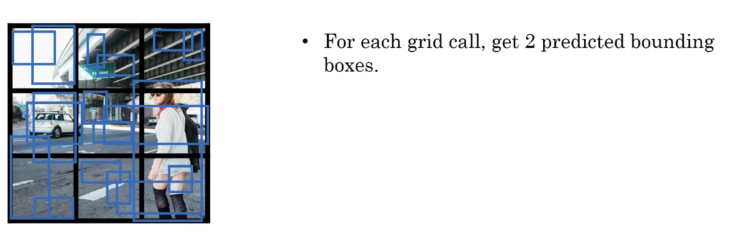
- Next, we then get rid of the low probability predictions.
- 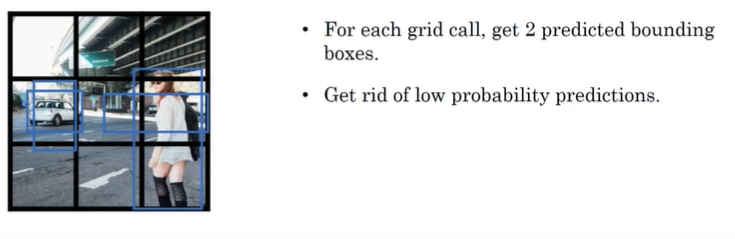
- Then finally if we have 3 classes we're trying to detect, we're trying to detect pedestrains, cars and motorcycles. What we do is, for each of the 3 classes, independently run non-max supression for the objects that were predicted to come from the class. Use non-max supression for predictions of the pedestrains class, run non-max supression for the car class and non-max supression for the motorcycle class. So run that basically 3 times to generate the final predictions. 
- So the output of this is hopefully that will have detected all the cars and all the pedestrains in the image
- 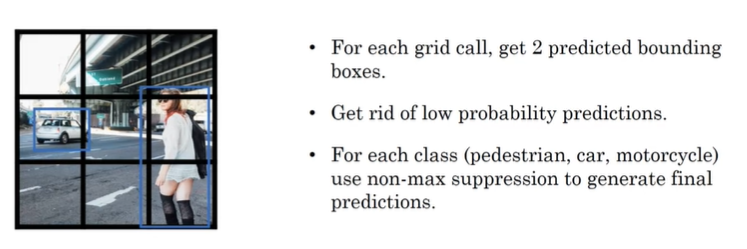

# Region Proposals
- If we recall the sliding windows ideam we would take a train crossfire and run it across all of these different windows and run the detector to see if there's a car, pedestrain or maybe a motorcycle. 
- Now, we could run the algorithm convolutionally, but one downside that the algorithm is it just crossfire a lot of the regions where there's clearly no object.

## Region-CNN
- What that does is it tries to pick just a few regions that makes sense to run out continent crossfire. So rather than running our sliding windows on every single window, we instead select just a few windows and run our continent corssfire on just a few windows. 
- The way that they perform the region proposals is to run an algorithm called a segmentation algorithm, inorder to figure out what could be objects. 
- 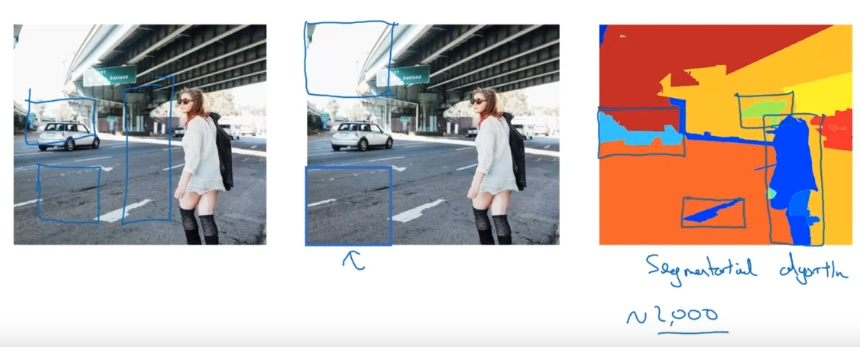
- It turns out the R-CNN algorithm is still quite slow.

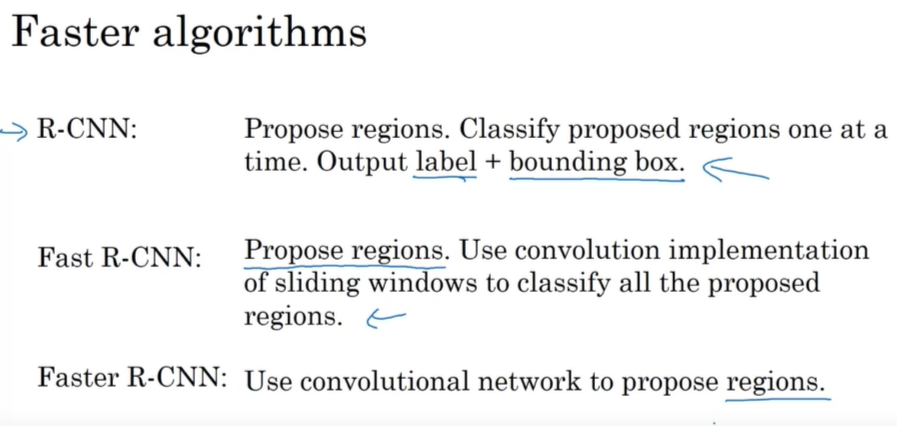

# Semantic Segmentation with U-Net
- Object Recognition : Where the goal is to input a picture and figure out what is in the picture, such as is that is a car or not.
- Object Detection : Where the goal is furthere put a bounding box around the object is found. 
- Sematic segmentation : Where the goal is to draw a careful outline around the object that is detected so that we know exactly which pixels belong to the object and which pixels don't.
- Let's say we're building a self-driving car and we see an input image and we'd like to detect the position of the other cars.
    - If we use an object detection algorithm, the goal may be to draw bounding boxes like these aroung the other vechiles. This might be good enough, but if we want our learning algorithm to figure out what is every single pixel in the image, then we may use a semantic segmentation algorithm.
    - For example, rather than detecting the road and trying to draw a bounding box around the roads, which isn't going to be that useful, with semantic segmentation the algorithm attemps to label every single pixel as is this drivable roads or not, indicated by the geen here.
    - 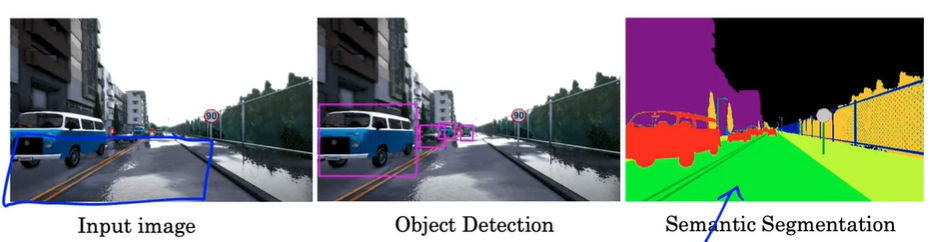
- 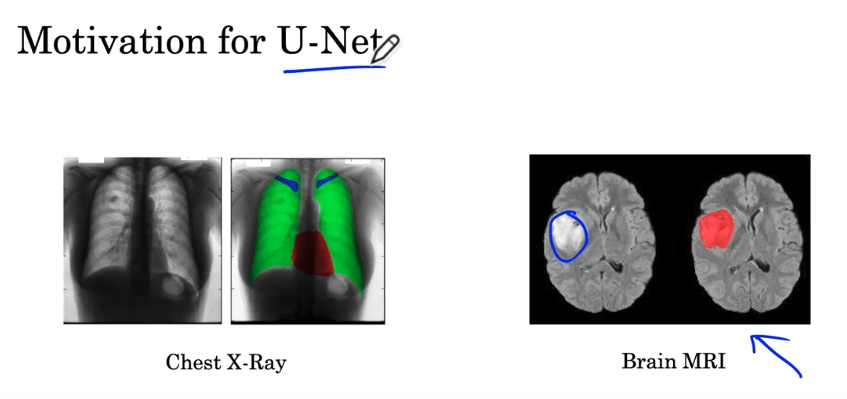

## Per-pixel class labels
- Oen for car and zero for not car. In this case, the job of the segmentation algorithm of the unit algorithm will be to output, either one or zero for every single pixel in the image, where a pizel should be labeled 1, if it is part of the car and label 0 if it's not part of th car.
- 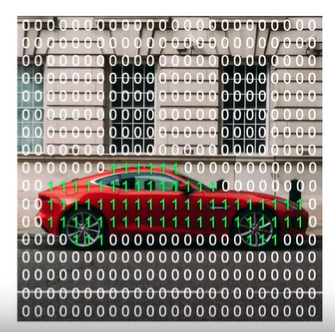
- Maybe we alos want to know where the building are. In this case we would have a 2nd class building and then finally the ground or the roads, class 3 , in which case the job the learning algorithm would be to label every pixel as follows 
- 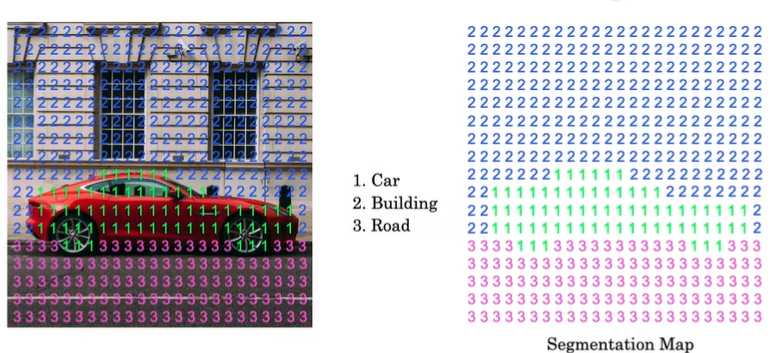
- The right output that we would like to train a unit table to give. This is a lot of outputs, instead of just giving a single class label or maybe a class label and coordinates needed to specify bounding box the neural network unit in this case, has to generate a whole matrix of labels.

## Deep Learning for Semantic Segmentation
- A familiar convolutional neural network architecture, where we input an image which is fed forward through multiple layers in order to generate a class label y_hat. 
- Inorder to change the architecture into a semantic segementation architecture, let's get rid of the last few layers and one key step of semantic segmentation, whereas the dimensions of the image have been generally getting smaller as we go from left to right, it now needs to get bigger so they can gradually blow it back up to full-size image, which is a size we want for the output.
- 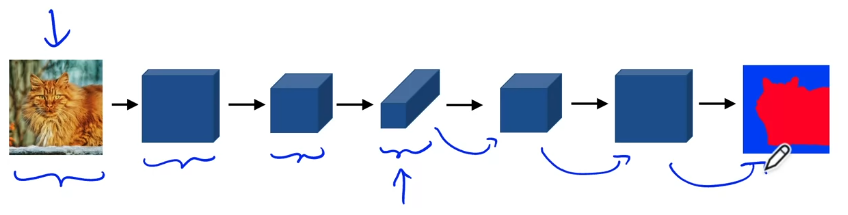

- The semantic segmentation, a very useful algorithm for many computer vision applications where the key idea is we have to take every single pixel and label every single pixel individually with the appropriate class label. A key step to do that is to take a small set of activations and blow it up to a bigger set of activations. Inorder to do that, we have to implement something called the transpose convolution, which is important operation that is used multiple times in the unit architecture.

# Transpose Convolutions
- The transpose convolution is a key part of the unit architecture.
- How do we take a 2x2 input adnd blow it up into a 4x4 dimenensional output? The transpose convolution lets us do that.
- The normal convolution in which a typical layer of a new network may input a 6x6x3 image, convolve that with a set of 5 3x3x3 filters, then we end up with an output that is 4x4x5. 
- A transpose convolution might input a 2x2, convoluve that with a 3x3 filter, and end up with an ouptut 4x4, that's bigger than the original inputs.
- 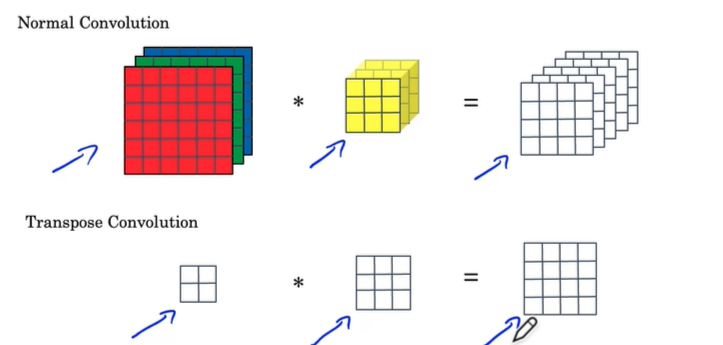
- In the regular convolution, we would take the filter and place it on top of the inputs and then multiply and sum up. In the transpose convolution, instead of placing the filter on the input, we would instead place a filter on the ouput.
- 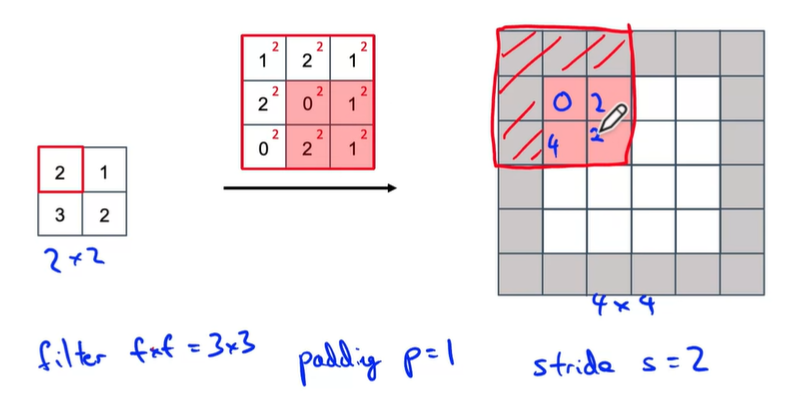
- 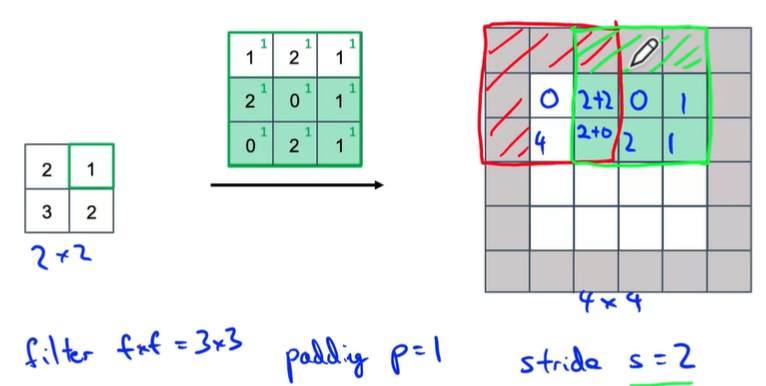
- 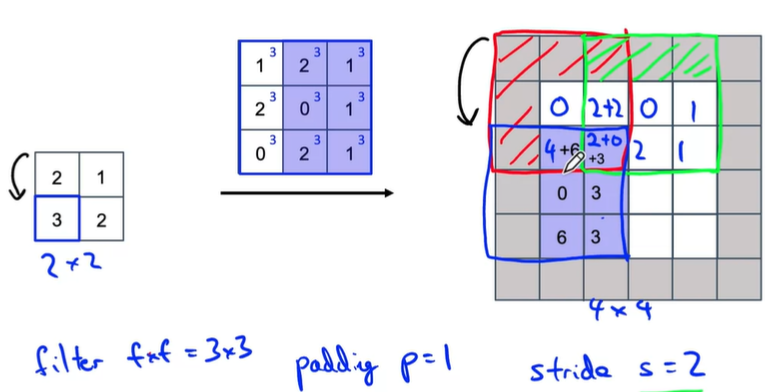
- 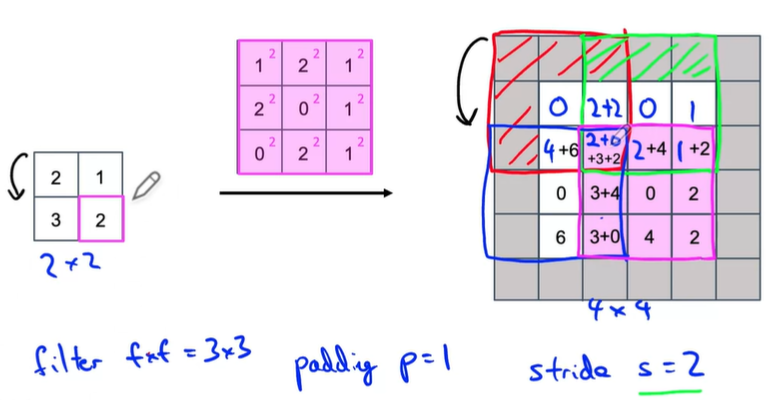
- 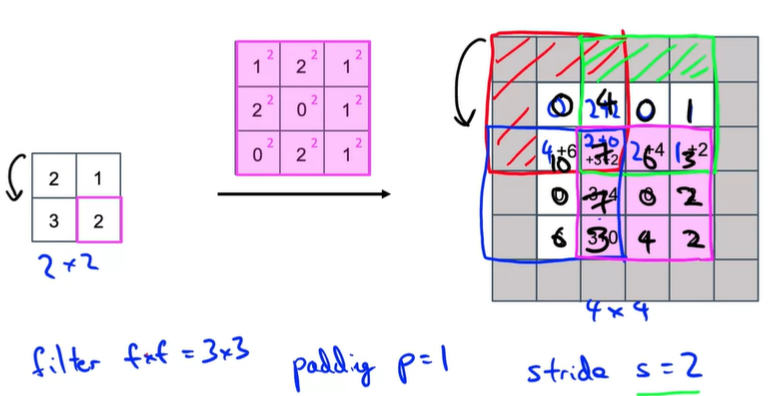
- When we learn all the parameters of the filter, this turns out to give good results when we put this the context of the union which is the learning algorithm will use now.

# U-Net Architecture Intuition
- We use normal convolutions for the 1st part of the neural network which will sort of compress the image. Then the 2nd half of this neural network uses the transports convolution to blow the representation size up back to the size of the original input image.
- It turns out that there's one modification to this architecture that would make it work much better, which is the skip connections from the earlier layers to the later layers. So the earlier block of activations is copied directly to the later block. 
- 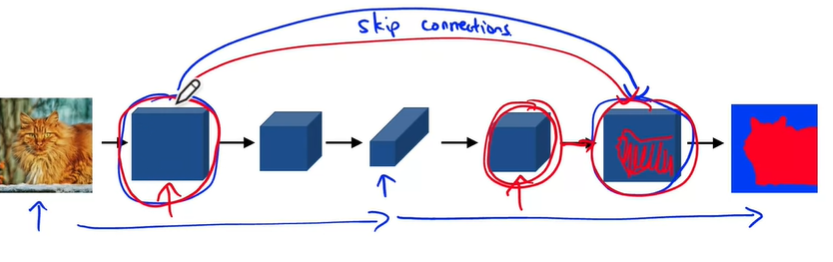

# U-Net Architecture
- 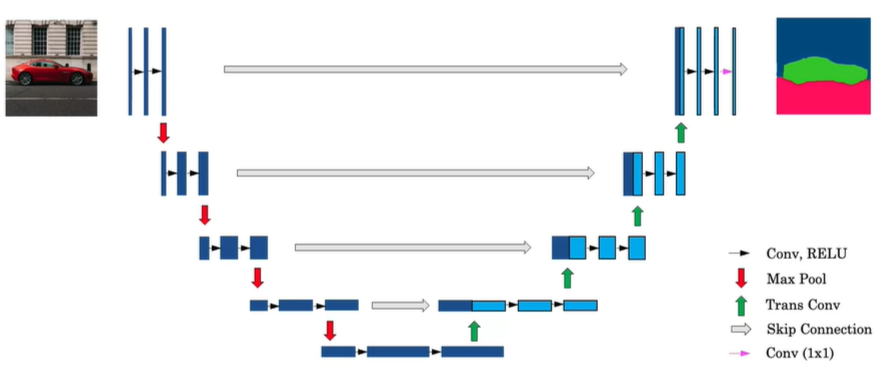
- The input to the U-Net is an image, let's say is hxwx3. The output layer is going to be hxw, so the same dimensions as our original input x num classes. So if we have 3 classes to try and recognize, this will be 3. If we have 10 different classes to try to recognize in our segmentation at then the num will be 10.